In [1]:
import geoanalytics
from geoanalytics.sql import functions as ST
from pyspark.sql import functions as F

import numpy as np
import matplotlib.pyplot as plt

# import os
# import imageio

geoanalytics.enable_warnings()

GeoAnalytics - [WARNING] - Warnings are enabled


In [2]:
print(f"spark.version: {spark.version}")
print(f"partitions: {sc.defaultParallelism}")
print(f"driver memory [local mode]: {spark.conf.get('spark.driver.memory')}")
figsize = {"figsize":(40,24)}

spark.version: 3.2.3
partitions: 12
driver memory [local mode]: 16g


Table of Contents

1. Data sources, spatial types and spatial references
2. Spatial Type Functions
3. Binning
4. Tools

### DATA
[NYC Tiger roads](https://catalog.data.gov/dataset/tiger-line-shapefile-2018-county-new-york-county-ny-all-roads-county-based-shapefile)

[NYC crashes](https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95)

[NYC Borough boundaries](https://www.arcgis.com/home/item.html?id=1f75b59e45444d7bae27454ec7730395)

# Data sources, spatial types and spatial references

root
 |-- geometry: linestring (nullable = true)
 |-- LINEARID: string (nullable = true)
 |-- FULLNAME: string (nullable = true)
 |-- RTTYP: string (nullable = true)
 |-- MTFCC: string (nullable = true)

SpatialReference(srid=4326, is_projected=False, unit='Degree', wkt='GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1984",6378137.0,298.257223563]],PRIMEM["Greenwich",0.0],UNIT["Degree",0.0174532925199433]]')
2058


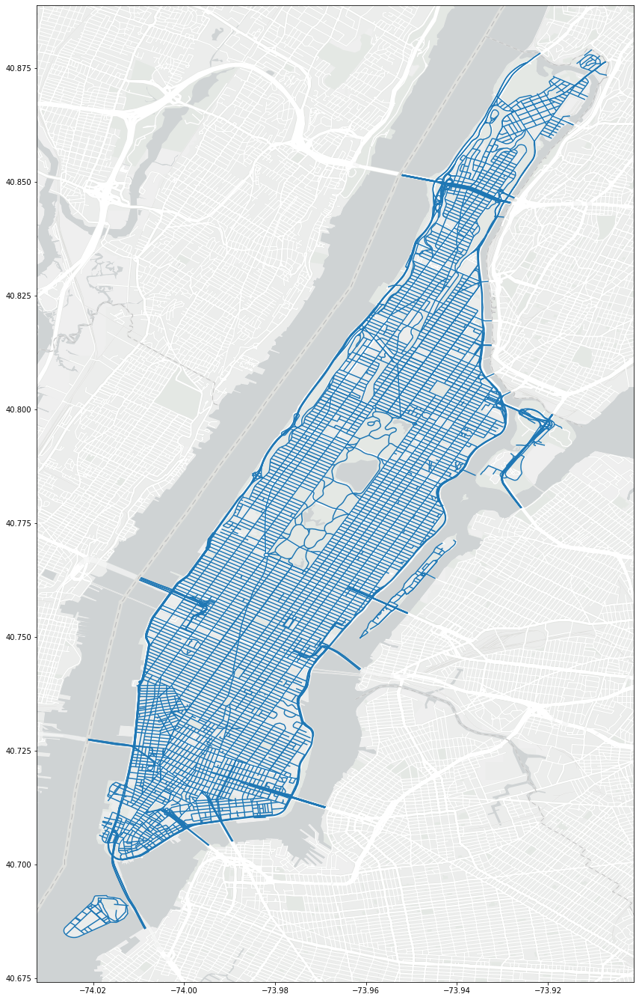

In [3]:
nyc_roads = spark.read.format("geojson").load("nyc_roads.geojson")
nyc_roads.printSchema()
print(nyc_roads.st.get_spatial_reference())
print(nyc_roads.count())
nyc_roads.st.plot(**figsize, basemap="light");

In [4]:
# since 2012 - Feb 2023
nyc_crashes = spark.read.csv("nyc_accidents.csv", inferSchema=True, header=True)
nyc_crashes.printSchema()
nyc_crashes.count()

root
 |-- CRASH DATE: string (nullable = true)
 |-- CRASH TIME: string (nullable = true)
 |-- BOROUGH: string (nullable = true)
 |-- ZIP CODE: integer (nullable = true)
 |-- LATITUDE: double (nullable = true)
 |-- LONGITUDE: double (nullable = true)
 |-- LOCATION: string (nullable = true)
 |-- ON STREET NAME: string (nullable = true)
 |-- CROSS STREET NAME: string (nullable = true)
 |-- FATALITIES: integer (nullable = true)



1970726

In [5]:
env_mh_crashes = nyc_crashes.filter("BOROUGH == 'MANHATTAN'")\
                .withColumn("point", ST.point("LONGITUDE", "LATITUDE", 4326))\
                .withColumn("CRASH DATE", F.to_date("CRASH DATE", "MM/dd/yyyy")) \
                .withColumn("year", F.year("CRASH DATE"))\
                .withColumn("hasFatality", F.col("FATALITIES") > 0)\
                .filter(ST.env_intersects("point", -74.1, 40.6, -73.85, 40.9))
env_mh_crashes.printSchema()
print(env_mh_crashes.count())

root
 |-- CRASH DATE: date (nullable = true)
 |-- CRASH TIME: string (nullable = true)
 |-- BOROUGH: string (nullable = true)
 |-- ZIP CODE: integer (nullable = true)
 |-- LATITUDE: double (nullable = true)
 |-- LONGITUDE: double (nullable = true)
 |-- LOCATION: string (nullable = true)
 |-- ON STREET NAME: string (nullable = true)
 |-- CROSS STREET NAME: string (nullable = true)
 |-- FATALITIES: integer (nullable = true)
 |-- point: point (nullable = true)
 |-- year: integer (nullable = true)
 |-- hasFatality: boolean (nullable = true)



297229


BoundingBox(min_x=-74.03107, min_y=40.60648, max_x=-73.851036, max_y=40.8730228)


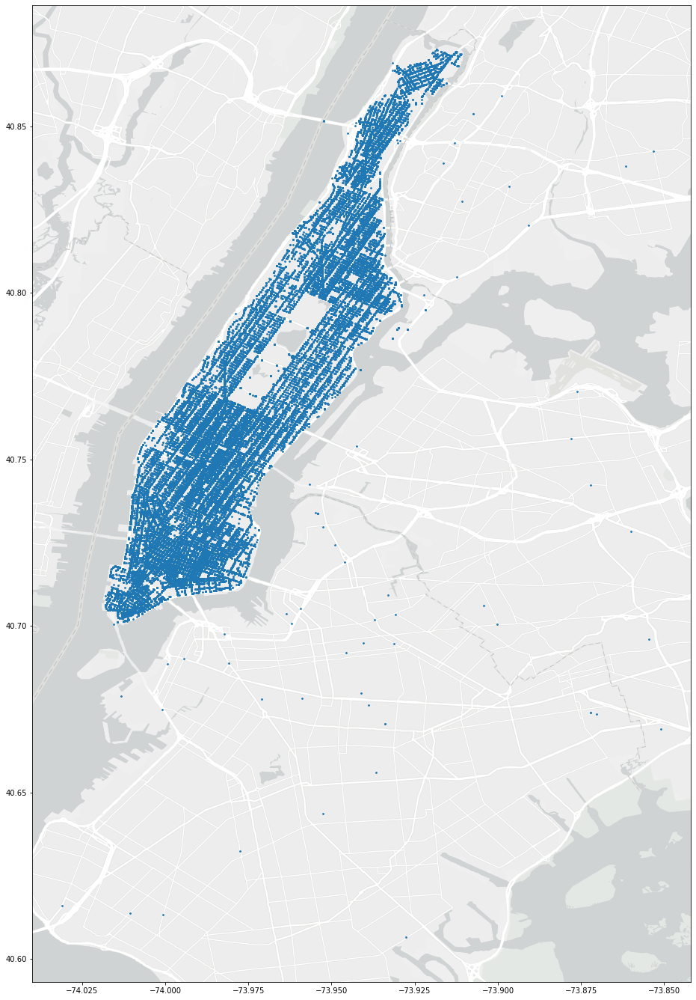

In [6]:
env_mh_crashes.st.plot(**figsize, basemap="light", marker_size=3);
print(env_mh_crashes.st.get_extent())

In [7]:
manhattan = spark.read.format("geoparquet").load("nyc_boro.parquet") \
                .filter("boro_name = 'MANHATTAN'") \
                .withColumn("vertex_cnt", ST.num_points("shape")) \
                .withColumn("path_cnt", F.size(ST.geometries("shape")))
manhattan.show()
manhattan.st.get_spatial_reference() # NYC sref

+---+---------+---------+------------------+----------------+--------------------+----------+--------+
| id|boro_code|boro_name|              area|          length|               shape|vertex_cnt|path_cnt|
+---+---------+---------+------------------+----------------+--------------------+----------+--------+
|  1|      1.0|MANHATTAN|6.36603499405884E8|361382.238823104|{"rings":[[[98121...|      6317|      34|
+---+---------+---------+------------------+----------------+--------------------+----------+--------+



SpatialReference(srid=2263, is_projected=True, unit='US Survey Foot', wkt='PROJCS["NAD_1983_StatePlane_New_York_Long_Island_FIPS_3104_Feet",GEOGCS["GCS_North_American_1983",DATUM["D_North_American_1983",SPHEROID["GRS_1980",6378137.0,298.257222101]],PRIMEM["Greenwich",0.0],UNIT["Degree",0.0174532925199433]],PROJECTION["Lambert_Conformal_Conic"],PARAMETER["False_Easting",984250.0],PARAMETER["False_Northing",0.0],PARAMETER["Central_Meridian",-74.0],PARAMETER["Standard_Parallel_1",40.66666666666666],PARAMETER["Standard_Parallel_2",41.03333333333333],PARAMETER["Latitude_Of_Origin",40.16666666666666],UNIT["Foot_US",0.3048006096012192]]')

https://spatialreference.org/ref/epsg/nad83-new-york-long-island-ftus/

In [8]:
%%time
mh_crashes_filtered = env_mh_crashes.join(manhattan).where(ST.intersects("point", "shape"))
mh_crashes_filtered.show(5)


GeoAnalytics - [WARNING] - The transformation '~WGS_1984_(ITRF00)_To_NAD_1983' was chosen for 'NAD_1983_StatePlane_New_York_Long_Island_FIPS_3104_Feet:2263' -> 'GCS_WGS_1984:4326'. Please see https://links.esri.com/geoanalytics-unspecified-transform for more details. 
GeoAnalytics - [WARNING] - The spatial references of the input geometries do not match. Automatically transforming geometries to GCS_WGS_1984:4326.


+----------+----------+---------+--------+---------+----------+--------------------+--------------+-----------------+----------+--------------------+----+-----------+---+---------+---------+------------------+----------------+--------------------+----------+--------+
|CRASH DATE|CRASH TIME|  BOROUGH|ZIP CODE| LATITUDE| LONGITUDE|            LOCATION|ON STREET NAME|CROSS STREET NAME|FATALITIES|               point|year|hasFatality| id|boro_code|boro_name|              area|          length|               shape|vertex_cnt|path_cnt|
+----------+----------+---------+--------+---------+----------+--------------------+--------------+-----------------+----------+--------------------+----+-----------+---+---------+---------+------------------+----------------+--------------------+----------+--------+
|2017-11-04|      0:00|MANHATTAN|   10034| 40.86755| -73.93034|(40.86755, -73.93...|          null|             null|         0|{"x":-73.93034,"y...|2017|      false|  1|      1.0|MANHATTAN|6.3660

GeoAnalytics - [WARNING] - The transformation '~WGS_1984_(ITRF00)_To_NAD_1983' was chosen for 'NAD_1983_StatePlane_New_York_Long_Island_FIPS_3104_Feet:2263' -> 'GCS_WGS_1984:4326'. Please see https://links.esri.com/geoanalytics-unspecified-transform for more details. 
GeoAnalytics - [WARNING] - The spatial references of the input geometries do not match. Automatically transforming geometries to GCS_WGS_1984:4326.


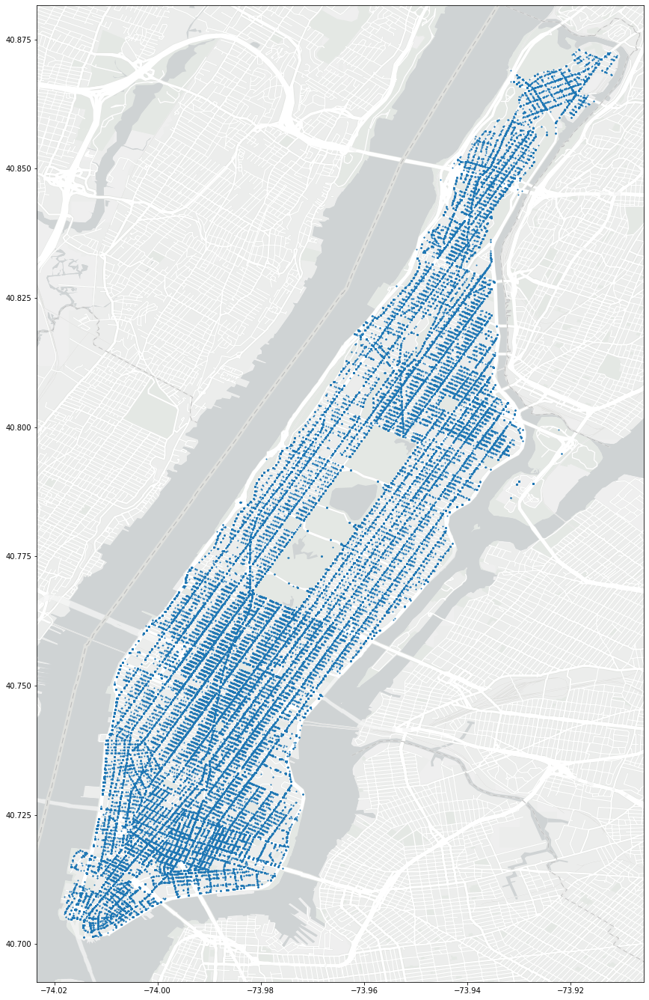

In [9]:
mh_crashes_filtered = env_mh_crashes.join(manhattan).where(ST.intersects("point", "shape"))
mh_crashes_filtered.st.plot(**figsize, geometry= "point", basemap="light", marker_size=1);

# ST Functions

In [10]:
geoanalytics.disable_warnings()

GeoAnalytics - [WARNING] - Warnings are disabled


In [11]:
%%time
mbb = manhattan.select(ST.min_bounding_box("shape").alias("box"))
mbb_mh_crashes = env_mh_crashes.join(mbb).where(ST.intersects("point", "box"))
mbb_mh_crashes.show(5)

+----------+----------+---------+--------+--------+---------+--------------------+----------------+-----------------+----------+--------------------+----+-----------+--------------------+
|CRASH DATE|CRASH TIME|  BOROUGH|ZIP CODE|LATITUDE|LONGITUDE|            LOCATION|  ON STREET NAME|CROSS STREET NAME|FATALITIES|               point|year|hasFatality|                 box|
+----------+----------+---------+--------+--------+---------+--------------------+----------------+-----------------+----------+--------------------+----+-----------+--------------------+
|2022-03-22|      5:52|MANHATTAN|   10007|40.71492|-74.01137|(40.71492, -74.01...|   MURRAY STREET| GREENWICH STREET|         0|{"x":-74.01137,"y...|2022|      false|{"rings":[[[10051...|
|2019-09-24|     16:14|MANHATTAN|   10007|40.71491|-74.01135|(40.71491, -74.01...|   MURRAY STREET| GREENWICH STREET|         0|{"x":-74.01135,"y...|2019|      false|{"rings":[[[10051...|
|2019-08-08|     12:50|MANHATTAN|   10007|40.71491|-74.01135

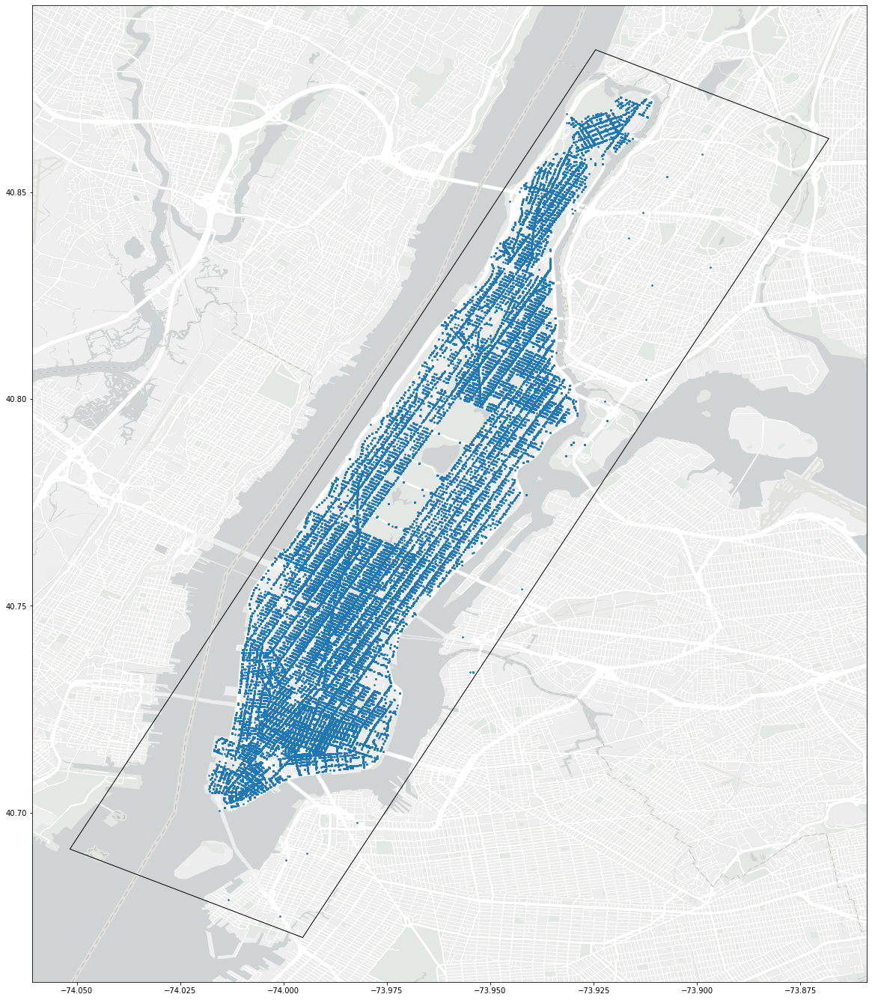

In [12]:
mbb = manhattan.select(ST.min_bounding_box("shape").alias("box"))
mbb_mh_crashes = env_mh_crashes.join(mbb).where(ST.intersects("point", "box"))
ax = mbb.select(ST.transform("box", 4326)).st.plot(**figsize, facecolor="none", basemap="light")
mbb_mh_crashes.st.plot(ax=ax,geometry= "point", marker_size=3);

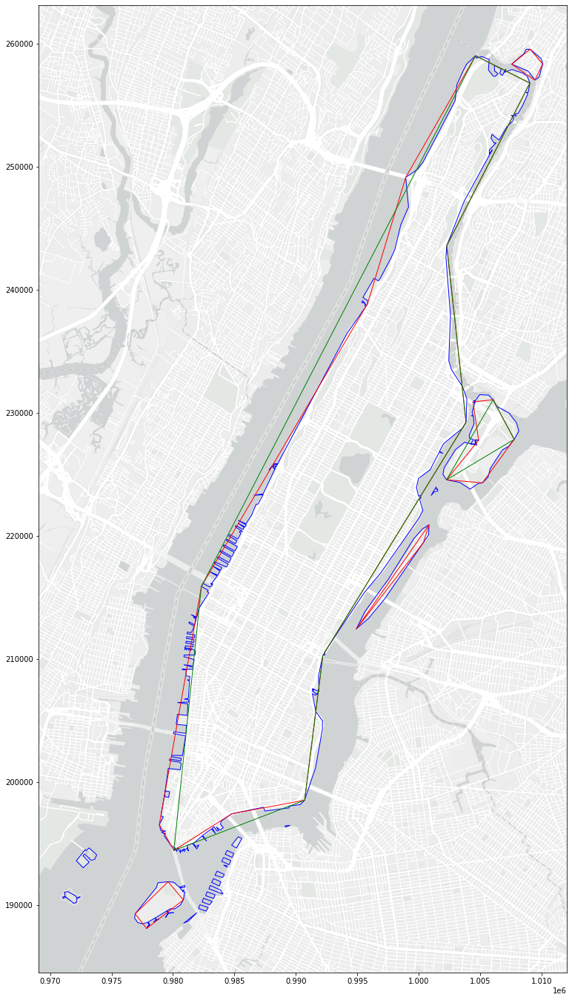

In [13]:
simple_manhattan100 = manhattan.select(ST.generalize("shape", F.lit(100)).alias("simple"))
ax100 = simple_manhattan100.st.plot(**figsize, basemap="light", facecolor="none", edgecolor="blue")

simple_manhattan1000 = manhattan.select(ST.generalize("shape", F.lit(1000)).alias("simple"))
ax1000 = simple_manhattan1000.st.plot(ax=ax100, facecolor="none", edgecolor="red")

simple_manhattan10000 = manhattan.select(ST.generalize("shape", F.lit(2000)).alias("simple"))
simple_manhattan10000.st.plot(ax=ax1000, facecolor="none", edgecolor="green");

In [14]:
%%time
mh_crashes_filtered = env_mh_crashes.join(simple_manhattan1000).where(ST.intersects("point", "simple"))
mh_crashes_filtered.show(5)

+----------+----------+---------+--------+---------+----------+--------------------+--------------+-----------------+----------+--------------------+----+-----------+--------------------+
|CRASH DATE|CRASH TIME|  BOROUGH|ZIP CODE| LATITUDE| LONGITUDE|            LOCATION|ON STREET NAME|CROSS STREET NAME|FATALITIES|               point|year|hasFatality|              simple|
+----------+----------+---------+--------+---------+----------+--------------------+--------------+-----------------+----------+--------------------+----+-----------+--------------------+
|2017-03-31|     23:50|MANHATTAN|   10034|40.867104|-73.929184|(40.867104, -73.9...|          null|             null|         0|{"x":-73.929184,"...|2017|      false|{"rings":[[[97960...|
|2017-03-13|     10:57|MANHATTAN|   10034|40.867104|-73.929184|(40.867104, -73.9...|          null|             null|         0|{"x":-73.929184,"...|2017|      false|{"rings":[[[97960...|
|2022-04-01|      4:25|MANHATTAN|   10034|40.867256| -73.929

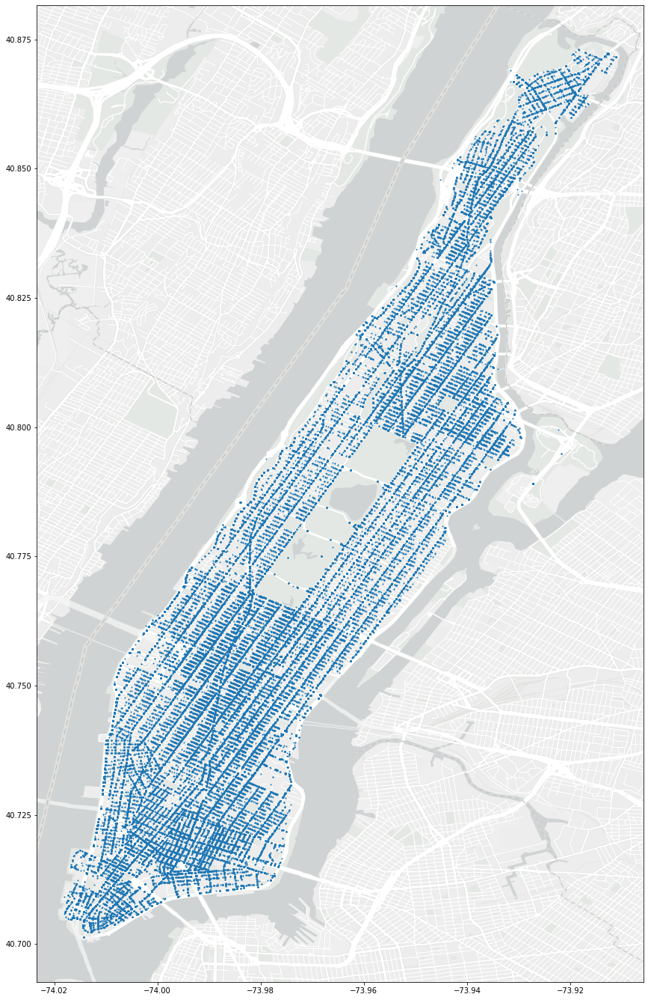

In [15]:
mh_crashes_filtered = env_mh_crashes.join(simple_manhattan1000).where(ST.intersects("point", "simple"))
mh_crashes_filtered.st.plot(**figsize, geometry= "point", basemap="light", marker_size=1);

# Binning

H3 binning cell [resolution](https://h3geo.org/docs/core-library/restable/)

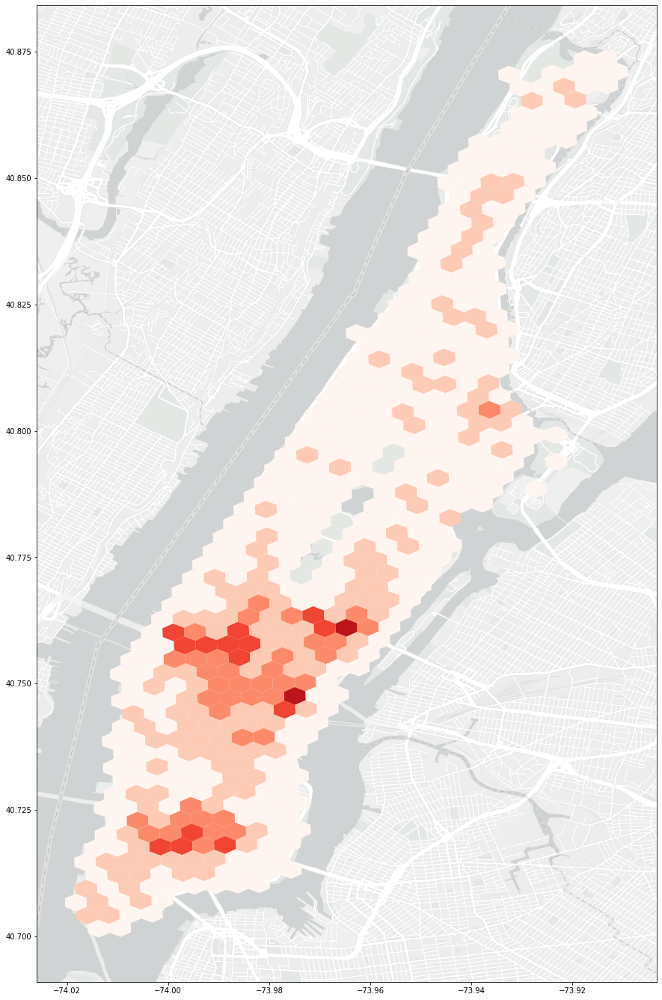

In [16]:
mh_crashes_filtered.withColumn("bin",ST.h3_bin("point", 9)).groupby("bin").count().withColumn("bin_geometry",ST.bin_geometry("bin"))\
    .st.plot(**figsize, basemap="light", cmap="Reds", cmap_values="count", classification_method="equalinterval");

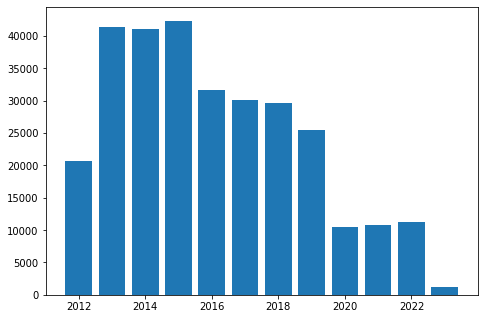

In [17]:
rows = mh_crashes_filtered.groupBy("year").count().orderBy("year").collect()
total = [(r.year, r["count"]) for r in rows]
total_arr = np.array(total)
years = total_arr[:,0]
counts = total_arr[:,1]

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(years,counts)
plt.show()

In [18]:
bins = [36.20, 71.40, 106.60, 141.80]

In [19]:
def filterByYear(year):
    return mh_crashes_filtered.filter(f"year = {year}").withColumn("bin",ST.h3_bin("point", 10)).groupby("bin").count().withColumn("bin_geometry",ST.bin_geometry("bin"))\
    .st.plot(figsize=(12,15), basemap="light", cmap="Reds", cmap_values="count", classification_method="userdefined", classification_kwds={"bins": bins})

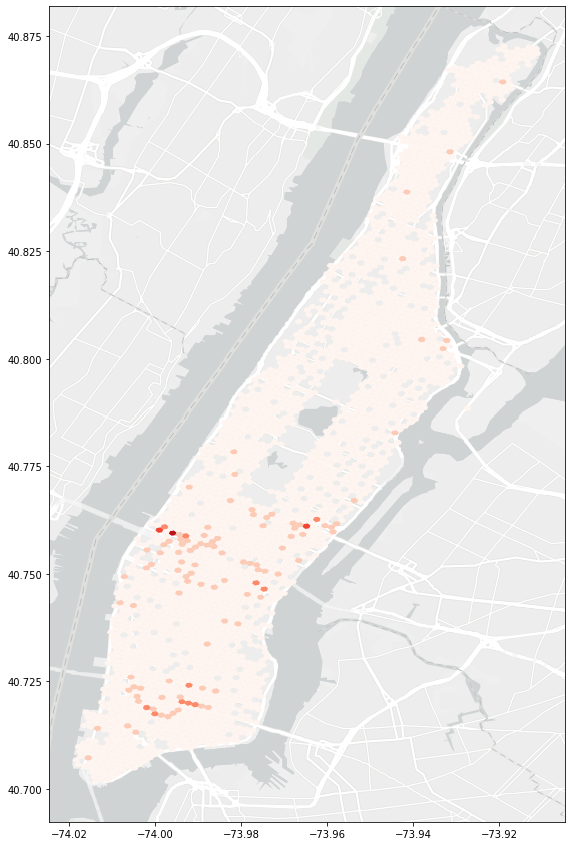

In [20]:
filterByYear(2018);


In [21]:
# canvases = []
# for i in range(2012, 2023):
#     ax = filterByYear(i)
#     ax.set_title(f"{i}")
#     fig = ax.get_figure()
#     temp_canvas = fig.canvas
#     canvases.append(temp_canvas)
    

    

In [22]:

# with imageio.get_writer("accidents.gif", mode="I") as writer:
#     for canvas in canvases:
#         canvas.draw()
#         img = canvas.tostring_rgb()
#         r,c = canvas.get_width_height()
#         imgarray = np.frombuffer(img, dtype=np.uint8).reshape(c, r, 3)
#         for _ in range(15):
#             writer.append_data(imgarray)
        

![SegmentLocal](accidents1.gif "segment")

In [23]:
mh_crashes_streets = mh_crashes_filtered.select("point","on street name","FATALITIES", "hasFatality") \
        .withColumnRenamed("on street name", "onstreet")
mh_crashes_streets.printSchema()

root
 |-- point: point (nullable = true)
 |-- onstreet: string (nullable = true)
 |-- FATALITIES: integer (nullable = true)
 |-- hasFatality: boolean (nullable = true)



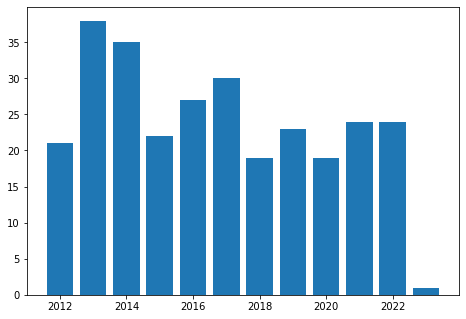

In [24]:
rows = mh_crashes_filtered.groupBy("year").sum("FATALITIES").orderBy("year").withColumnRenamed("sum(FATALITIES)", "sum").collect()
total = [(r.year, r["sum"]) for r in rows]
total_arr = np.array(total)
years = total_arr[:,0]
deaths = total_arr[:,1]

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(years,deaths)
plt.show()

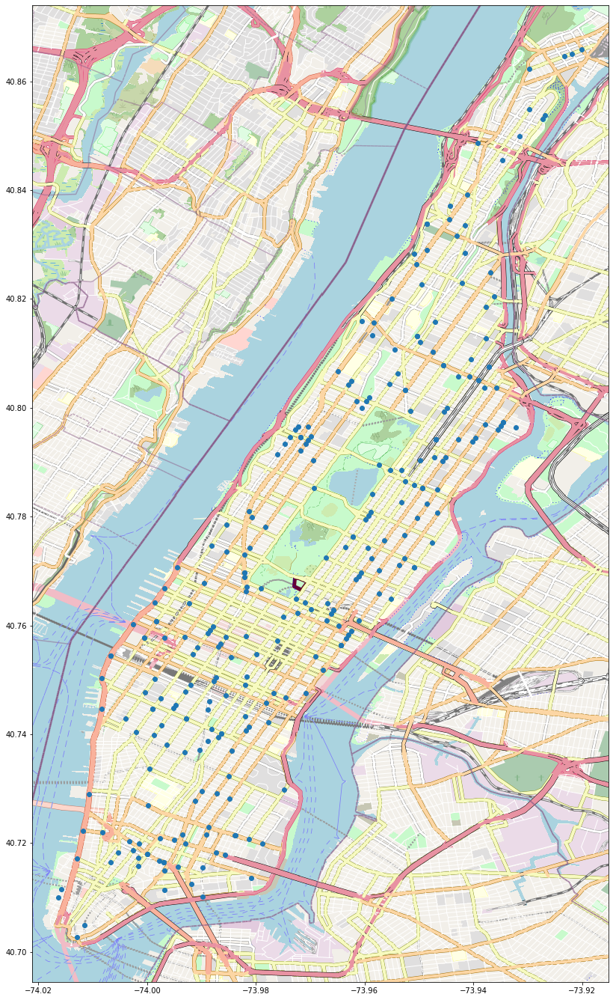

In [25]:
mh_crashes_filtered.where("hasFatality").st.plot(**figsize, geometry="point", basemap="osm");

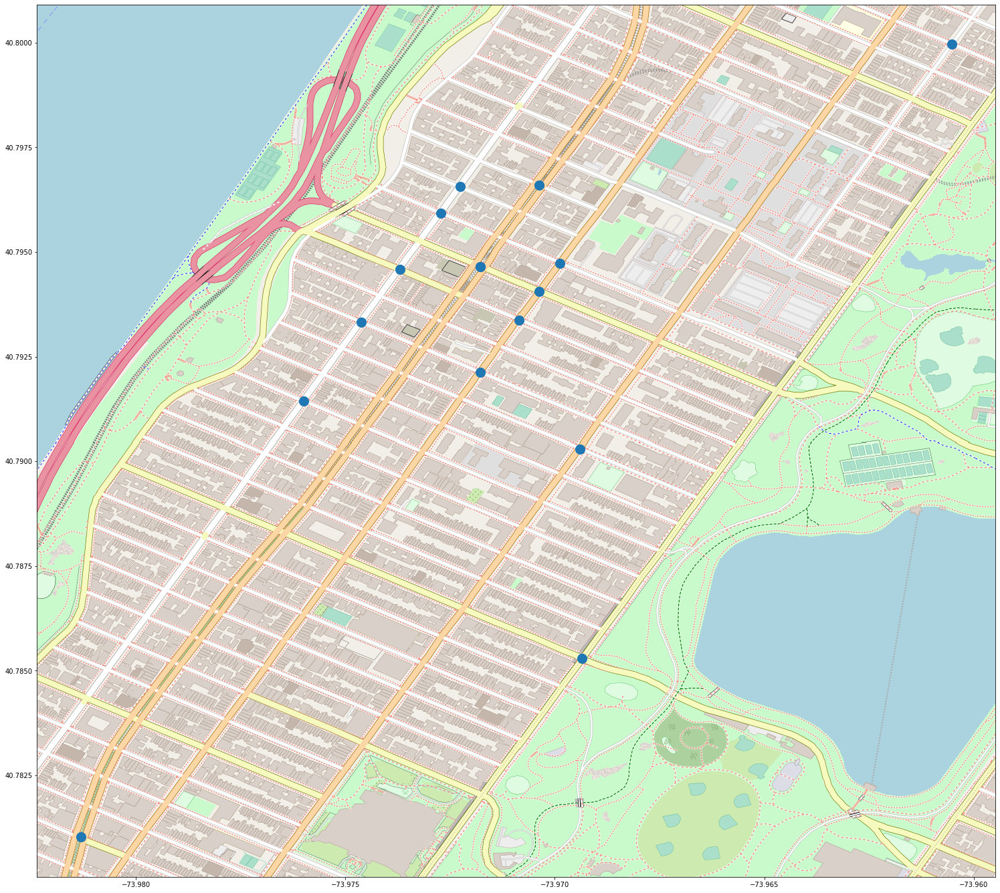

In [26]:
q1 = mh_crashes_filtered.where(ST.env_intersects("point",-74,40.78,-73.96,40.80 )).where("hasFatality")
q1.st.plot(**figsize, geometry="point", basemap="osm", marker_size=200);

In [27]:
q1.orderBy("year").select("CRASH DATE", "CRASH TIME", "ON STREET NAME").show()

+----------+----------+-----------------+
|CRASH DATE|CRASH TIME|   ON STREET NAME|
+----------+----------+-----------------+
|2012-07-14|     21:20|         BROADWAY|
|2013-06-04|      8:15|   WEST 97 STREET|
|2014-07-20|     14:03| MANHATTAN AVENUE|
|2014-09-07|     19:55|  WEST END AVENUE|
|2014-01-19|      4:44|   WEST 96 STREET|
|2014-01-10|     20:13|         BROADWAY|
|2014-01-10|     20:48|   WEST 97 STREET|
|2014-07-10|     11:08|   WEST 95 STREET|
|2016-01-14|     17:46|   WEST 96 STREET|
|2016-08-23|     15:50|   WEST 93 STREET|
|2016-06-28|     20:37|         BROADWAY|
|2017-02-24|      5:57| AMSTERDAM AVENUE|
|2019-07-19|     15:32|  WEST END AVENUE|
|2021-06-29|     17:38|CENTRAL PARK WEST|
|2022-01-24|     11:51| AMSTERDAM AVENUE|
|2022-12-04|      5:06|   WEST 92 STREET|
+----------+----------+-----------------+



https://www.nyc.gov/html/dot/downloads/pdf/2014-08-12-west-end-ave-public_meeting.pdf

In [28]:
from geoanalytics.tools import FindPointClusters



In [29]:
fpc =FindPointClusters()
fpc.setClusterMethod("HDBSCAN")
fpc.setMinPointsCluster(5)
fpc_output = fpc.run(mh_crashes_filtered.where("hasFatality").withColumn("projected_point", ST.transform("point", 2263)).st.set_geometry_field("projected_point"))
fpc_output.printSchema()

root
 |-- CRASH DATE: date (nullable = true)
 |-- CRASH TIME: string (nullable = true)
 |-- BOROUGH: string (nullable = true)
 |-- ZIP CODE: integer (nullable = true)
 |-- LATITUDE: double (nullable = true)
 |-- LONGITUDE: double (nullable = true)
 |-- LOCATION: string (nullable = true)
 |-- ON STREET NAME: string (nullable = true)
 |-- CROSS STREET NAME: string (nullable = true)
 |-- FATALITIES: integer (nullable = true)
 |-- point: point (nullable = true)
 |-- year: integer (nullable = true)
 |-- hasFatality: boolean (nullable = true)
 |-- simple: polygon (nullable = true)
 |-- projected_point: point (nullable = true)
 |-- CLUSTER_ID: integer (nullable = true)
 |-- PROB: double (nullable = true)
 |-- STABILITY: double (nullable = true)
 |-- OUTLIER: double (nullable = true)
 |-- EXEMPLAR: integer (nullable = true)
 |-- COLOR_ID: integer (nullable = true)



In [30]:
%%time
# number of clusters
fpc_output.select("COLOR_ID").distinct().count()

CPU times: user 10.8 ms, sys: 5.36 ms, total: 16.1 ms
Wall time: 5.77 s


9

In [ ]:
fpc_output.st.plot(**figsize, geometry="point", basemap="light", cmap="tab20", cmap_values="COLOR_ID",is_categorical=True);

In [ ]:
# geoanalytics.register_gis("GIS2", url="https://analysis-0.mapsdevext.arcgis.com/", username="testdevhive0", password="analys1s")

In [ ]:
# write_to_fs = fpc_output.select("COLOR_ID", "point", "NUMBER OF PERSONS KILLED")
# write_to_fs.printSchema()

In [ ]:
# write_to_fs.write.format("feature-service").option("gis", "GIS2").option("layerName", "nyc_crashes").save()

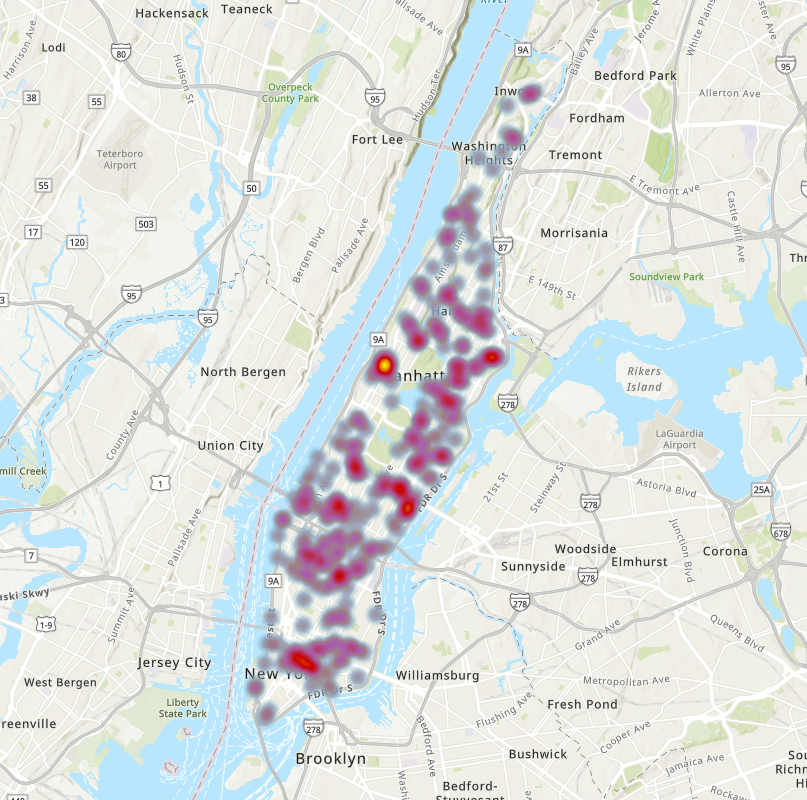

In [ ]:
# q = nyc_roads.withColumn("geometry", ST.transform("geometry", 2263)) \
#         .join(mh_crashes_streets) \
#         .where("ST_Dwithin(geometry, point, 60)") \
#         .groupBy("fullname") \
#         .agg(F.first("geometry"), F.sum("killed"), F.count("*").alias("count"))

In [ ]:
# q.st.plot(figsize=(10,20), cmap="Reds", cmap_values="count", classification_method="equalInterval", legend=True, basemap="light")

In [ ]:
# env_mh_crashes = nyc_crashes.filter("BOROUGH == 'MANHATTAN'")\
#                 .withColumn("point", ST.point("LONGITUDE", "LATITUDE", 4326))\
#                 .withColumn("CRASH DATE", F.to_date("CRASH DATE", "MM/dd/yyyy")) \
#                 .withColumn("hour", F.split("CRASH TIME",":").getItem(0).cast("int")) \
#                 .withColumn("year", F.year("CRASH DATE"))\
#                 .withColumn("month", F.month("CRASH DATE")) \
#                 .withColumn("winter", F.when((F.col("month") > 11) | (F.col("month") < 3), True).otherwise(False)) \
#                 .withColumn("night", F.when((F.col("hour") > 20) | (F.col("hour") < 8), True).otherwise(False)) \
#                 .filter(ST.env_intersects("point", -74.1, 40.6, -73.85, 40.9))
# env_mh_crashes.printSchema()
# print(env_mh_crashes.count())

In [ ]:
# nyc_roads.join(mh_crashes_streets).where("onstreet = fullname").count()

In [ ]:
# nyc_roads.join(mh_crashes_streets).where("ST_Intersects(geometry, point)").count()